# Requirements

In [1]:
%pip install transformers
%pip install torch
%pip install pickle5
%pip install mpld3
%pip install scikit-learn

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [2]:
# Clear torch cache

import torch
torch.cuda.empty_cache()

/home/team4/anaconda3/envs/pig/lib/python3.6/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


# Load pretrained Bert model and tokenizer

In [3]:
import torch
from transformers import BertTokenizer, BertModel

import logging
#logging.basicConfig(level=logging.INFO)

import matplotlib.pyplot as plt
%matplotlib inline

# Load pre-trained model (weights)
model = BertModel.from_pretrained('bert-base-uncased', output_hidden_states = True)
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = model.to(device)
model.eval()
tokenizer = BertTokenizer.from_pretrained('bert-base-uncased')

Some weights of the model checkpoint at bert-base-uncased were not used when initializing BertModel: ['cls.predictions.transform.LayerNorm.bias', 'cls.predictions.decoder.weight', 'cls.seq_relationship.bias', 'cls.predictions.transform.dense.bias', 'cls.predictions.transform.LayerNorm.weight', 'cls.predictions.bias', 'cls.seq_relationship.weight', 'cls.predictions.transform.dense.weight']
- This IS expected if you are initializing BertModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing BertModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).


# Load words and embeddings

In [4]:

import pickle5 as pickle

def open_pklfile(filepath, size):
	"""Open pickle file from the file path.

	Load all contents if `size` is 0, else slice and return.
	"""
	with open(filepath, "rb") as f:
		data = pickle.load(f)
	return data if not size else data[:size]

def split_word_and_embeddings(pair_list):
	"""Split word and embedding pairs."""
	words = [word for word, _ in pair_list]
	embeddings = torch.tensor([embed for _, embed in pair_list], device=device)
	return words, embeddings


# Experiment 1 : Clustering

In [5]:
import matplotlib as mpl
import matplotlib.pyplot as plt
import mpld3
from cycler import cycler
from sklearn.manifold import TSNE
from sklearn.cluster import KMeans

mpld3.enable_notebook()
mpl.rc("savefig", dpi=200)
mpl.rcParams['figure.figsize'] = (8,8)
mpl.rcParams['axes.prop_cycle'] = cycler(color='rc')


def visualize(embeddings, labels, ax, title, random_state, num_clusters = 2):
    X_embedded = TSNE(n_components=2, random_state=random_state).fit_transform(embeddings)
    if num_clusters == 2:
        for x, l in zip(X_embedded, labels):
            if l:
                ax.scatter(x[0], x[1], marker = '.', c = 'c')
            else:
                ax.scatter(x[0], x[1], marker = 'x', c = 'darkviolet')
    else:
        ax.scatter(X_embedded[:,0], X_embedded[:,1], c = labels)
    ax.text(.01, .9, title ,transform=ax.transAxes, fontsize=18)


def cluster_and_visualize(embed_bef, embed_aft, labels, save_filename, random_state = 1, num=2):
    fig, axs = plt.subplots(1, 2, figsize=(15, 3))

    # Clustering embeddings before debiasing
    prediction_bef = KMeans(n_clusters=num, random_state=random_state).fit_predict(embed_bef.cpu())
    visualize(embed_bef.cpu(), labels, axs[0], 'Original', random_state)
    correct = [1 if item1 == item2 else 0 for (item1, item2) in zip(labels, prediction_bef)]
    print("Precision before: ", sum(correct)/len(correct))
    
    # Clustering embeddings after debiasing
    prediction_aft = KMeans(n_clusters=num, random_state=random_state).fit_predict(embed_aft.cpu())
    visualize(embed_aft.cpu(), prediction_aft, axs[1], 'Debiased', random_state)
    correct = [1 if item1 == item2 else 0 for (item1, item2) in zip(labels, prediction_aft)]
    print("Precision after: ", sum(correct)/len(correct))
    
    fig.show()
    fig.savefig("../results/" + save_filename, bbox_inches='tight')


### 2016 Hard_Debiased Clustering

Precision before:  0.999
Precision after:  0.999


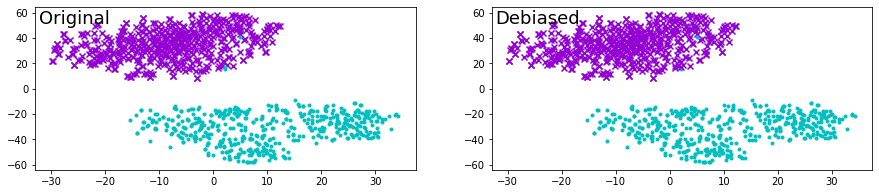

In [6]:

# 2016 Hard_debiased
# Cluster most biased words before and after debiasing

debiased = "sent_debiased"

# Original
top500_male_words = open_pklfile(f"../data/extracted/bert_2016_male_2500_vocab.pkl", 500)
top500_male_embeddings = open_pklfile(f"../data/extracted/bert_2016_male_2500_embeddings.pkl", 500)
top500_female_words = open_pklfile(f"../data/extracted/bert_2016_female_2500_vocab.pkl", 500)
top500_female_embeddings = open_pklfile(f"../data/extracted/bert_2016_female_2500_embeddings.pkl", 500)

# # Debiased
# debiased_top500_male_words = open_pklfile(f"../data/extracted/bert_{debiased}_2016_male_2500_vocab.pkl", 500)
# debiased_top500_female_embeddings = open_pklfile(f"../data/extracted/bert_{debiased}_2016_female_2500_embeddings.pkl", 500)
# debiased_top500_male_words = open_pklfile(f"../data/extracted/bert_{debiased}_2016_male_2500_vocab.pkl", 500)
# debiased_top500_female_embeddings = open_pklfile(f"../data/extracted/bert_{debiased}_2016_female_2500_embeddings.pkl", 500)

# assert(top500_male_words == debiased_top500_male_words)
# assert(top500_female_words == debiased_top500_female_words)

embeddings = torch.cat([top500_male_embeddings, top500_female_embeddings], dim=0)
# debiased_embeddings = torch.cat([debiased_top500_male_embeddings, debiased_top500_female_embeddings], dim=0)
debiased_embeddings = embeddings  # add after debiasing

labels = [0] * 500 + [1] * 500  # 0 for male, 1 for female
cluster_and_visualize(embeddings, debiased_embeddings, labels, f"bert_{debiased}_clustering_2016")


### 2018 GN_GloVe Clustering

Precision before:  1.0
Precision after:  1.0


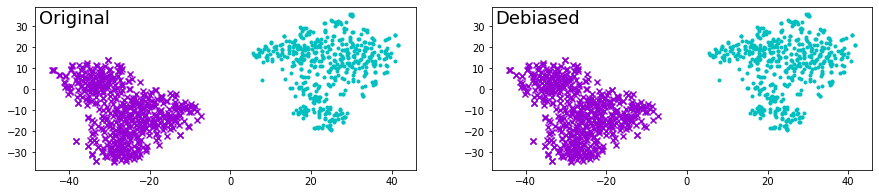

In [7]:

# 2018 GN_GloVe
# Cluster most biased words before and after debiasing

debiased = "sent_debiased"

# Original
top500_male_words = open_pklfile(f"../data/extracted/bert_2018_male_2500_vocab.pkl", 500)
top500_male_embeddings = open_pklfile(f"../data/extracted/bert_2018_male_2500_embeddings.pkl", 500)
top500_female_words = open_pklfile(f"../data/extracted/bert_2018_female_2500_vocab.pkl", 500)
top500_female_embeddings = open_pklfile(f"../data/extracted/bert_2018_female_2500_embeddings.pkl", 500)

# # Debiased
# debiased_top500_male_words = open_pklfile(f"../data/extracted/bert_{debiased}_2018_male_2500_vocab.pkl", 500)
# debiased_top500_female_embeddings = open_pklfile(f"../data/extracted/bert_{debiased}_2018_female_2500_embeddings.pkl", 500)
# debiased_top500_male_words = open_pklfile(f"../data/extracted/bert_{debiased}_2018_male_2500_vocab.pkl", 500)
# debiased_top500_female_embeddings = open_pklfile(f"../data/extracted/bert_{debiased}_2018_female_2500_embeddings.pkl", 500)

# assert(top500_male_words == debiased_top500_male_words)
# assert(top500_female_words == debiased_top500_female_words)

embeddings = torch.cat([top500_male_embeddings, top500_female_embeddings], dim=0)
# debiased_embeddings = torch.cat([debiased_top500_male_embeddings, debiased_top500_female_embeddings], dim=0)
debiased_embeddings = embeddings  # add after debiasing

labels = [0] * 500 + [1] * 500  # 0 for male, 1 for female
cluster_and_visualize(embeddings, debiased_embeddings, labels, f"bert_{debiased}_clustering_2018")


# Experiment 3 : Professions

### 2016 Hard_debiased, 2018 GN_GloVe
Choose either for your experiment

In [18]:
import numpy as np
from torch import linalg


def normalize(embeddings):
    norms = linalg.norm(embeddings, dim=1)
    embeddings = embeddings / norms[:, np.newaxis]
    return embeddings

In [25]:
year = 2018  # 2016, 2018
debiased = "sent_debiased"

# All words and embeddings
vocab = open_pklfile(f"../data/extracted/{year}_restricted_vocab.pkl", 0)
vocab_to_index = {w: i for i, w in enumerate(vocab)}

embeddings = open_pklfile(f"../data/extracted/{year}_restricted_embeddings.pkl", 0)
embeddings = normalize(embeddings)
# debiased_embeddings = open_pklfile(f"../data/extracted/{debiased}_{year}_restricted_embeddings.pkl", 0)
# debiased_embeddings = debiased_normalize(embeddings)

In [26]:
# Aggregated male and female embedding
# ex. man, woman, boy, girl, grandfather, grandmother, ..

male_words = open_pklfile(f"../data/extracted/male_word_file_vocab.pkl", 0)
male_embeddings = open_pklfile(f"../data/extracted/male_word_file_embeddings.pkl", 0)
female_words = open_pklfile(f"../data/extracted/female_word_file_vocab.pkl", 0)
female_embeddings = open_pklfile(f"../data/extracted/female_word_file_embeddings.pkl", 0)

male_embeddings, female_embeddings = normalize(male_embeddings), normalize(female_embeddings)
male_embedding = torch.sum(male_embeddings, dim = 0, keepdim = True)
female_embedding = torch.sum(female_embeddings, dim = 0, keepdim = True)

male_female_embedding = torch.cat((male_embedding, female_embedding), 0)
male_female_embedding = normalize(male_female_embedding)


In [27]:
# Load professions

import json
import codecs

def extract_professions():
    with codecs.open('../data/lists/professions.json', 'r', 'utf-8') as f:
        data = json.load(f)
    professions = [datum[0].strip() for datum in data]
    return professions

professions = extract_professions()

In [28]:
# Auxiliary Functions

def compute_bias_by_projection(embeddings):
    male_similarity = torch.tensordot(embeddings, male_female_embedding[0], dims=1)
    female_similarity = torch.tensordot(embeddings, male_female_embedding[1], dims=1)

    biases = { word: male_similarity[i] - female_similarity[i] \
              for i, word in enumerate(vocab) }
    return biases


def bias_and_neighbours(words, biases):
    """Biases and number of neighbours for all words.

    Args:
        words (list): target words
        biases (dict[str:tensor]): maps all word to bias level
    
    Returns:
        tuples (str, dict[str:tensor], int): (word, bias, male_neighbours)
    """
    tuples = []

    for word in words:
        if word not in biases:
            continue

        closest_words = topK(word, k=105)[:100]
        male_neighbours = 0
        for word in closest_words:
            if biases[word] > 0:
                male_neighbours += 1

        tuples.append((word, biases[word], male_neighbours))
    # from pprint import pprint
    # pprint(tuples)
    return tuples


def topK(word, k=10):
    # extract the word embedding for word
    word_idx = vocab_to_index[word]
    embedding = embeddings[word_idx, :]
    
    # compute similarity of w with all words in the vocabulary
    sim = torch.tensordot(embeddings, embedding, dims=1)
    _, indices = torch.sort(sim, descending=True)
    topK = indices[:(k+1)]
    return [vocab[idx] for idx in topK if idx != word_idx]


In [29]:

import scipy.stats

def compute_corr(tuples):
    biases, male_neighbours = [], []
    for word, bias, male_neighbour in tuples:
        biases.append(bias.item())
        male_neighbours.append(male_neighbour)
    print("Pearson Correlation: ", end="")
    print(scipy.stats.pearsonr(biases, male_neighbours))


def show_plots(profession_tuples, debiased_profession_tuples):
    fig, axs = plt.subplots(2, 1, figsize=(8, 8))
    
    for i, (tuples, title) in enumerate([(profession_tuples, "Original"), 
                                         (debiased_profession_tuples, "Debiased")]):
        X, Y = [], []
        for word, bias, male_neighbours in tuples:
            X.append(bias.cpu())
            Y.append(male_neighbours)
        axs[i].scatter(X, Y, color = 'c', s = 12)
        axs[i].set_ylim(0, 100)
        
        original_words = ['nanny', 'dancer', 'housekeeper', 'receptionist', 'nurse',\
                   'magician', 'musician', 'warden', 'archaeologist', 'comic', 'dentist',\
                    'inventor', 'colonel', 'farmer', 'skipper', 'commander', 'coach', 'programmer',\
                    "trumpeter", "tutor", "tycoon", "undersecretary", "understudy", "valedictorian",\
                    "vice_chancellor", "violinist", "vocalist", "waiter", "waitress", "warden", "warrior", "welder", "worker"]
        original_words += ['colonel', 'taxi_driver', 'officer', 'butcher', 'bodyguard', 'soldier',\
                        'neurologist', 'lawyer', 'architect', 'chef', 'author',\
                        'interior_designer', 'receptionist', 'homemaker', 'hairdresser']
        for word, bias, male_neighbours in tuples:
            if word in original_words:
                axs[i].annotate(word, xy=(bias.cpu(), male_neighbours), xytext=(bias.cpu(), male_neighbours), 
                                textcoords="data", fontsize=12) 
        axs[i].text(.03, .85, title, transform=axs[i].transAxes, fontsize=20)

    fig.show()
    fig.savefig(f"../results/bert_{debiased}_professions_{year}", bbox_inches='tight')


Pearson Correlation: (0.8051105440265901, 7.154062851217135e-59)


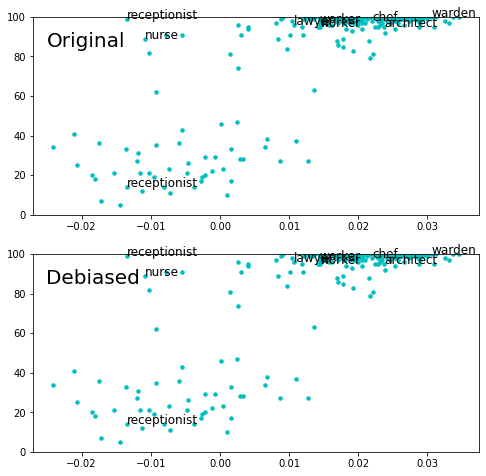

In [30]:
# Plot professions with number of male neighbours (y-axis) and bias level (x-axis)

from pprint import pprint
# print("professions:")
# pprint(professions)

biases = compute_bias_by_projection(embeddings)
# debiased_biases = compute_bias_by_projection(debiased_embeddings)

profession_tuples = bias_and_neighbours(professions, biases)
# debiased_profession_tuples = bias_and_neighbours(professions, debiased_biases)

compute_corr(profession_tuples)
# compute_corr(debiased_profession_tuples)

debiased_profession_tuples = profession_tuples  # To remove
show_plots(profession_tuples, debiased_profession_tuples)


# Experiment 5 : Classification with SVM

In [15]:
from sklearn import svm
import random
random.seed(10)

def train_and_predict(male_embeddings, female_embeddings):
    assert(len(male_embeddings) == len(female_embeddings))
    assert(len(male_embeddings) % 5 == 0)
    total = len(male_embeddings)
    train_size, test_size = int(total * 0.2), int(total * 0.8)
    
    # Train
    train_embed = torch.cat([male_embeddings[:train_size], female_embeddings[:train_size]], dim = 0)
    train_label = [1] * train_size + [0] * train_size

    clf = svm.SVC()
    clf.fit(train_embed.cpu(), train_label)

    # Test
    test_embed = torch.cat([male_embeddings[train_size:total], female_embeddings[train_size:total]], dim = 0)
    test_label = [1] * test_size + [0] * test_size

    predictions = clf.predict(test_embed.cpu())
    accuracy = [1 if pred == label else 0 for pred, label in zip(predictions, test_label)]
    print("Classification accuracy: ", sum(accuracy) / len(accuracy))

### 2016 Hard_Debiased SVM

In [16]:
# 2016 Hard_debiased
# Classify 2500 most biased words before and after debiasing

debiased = "sent_debiased"

# Original
top2500_male_words = open_pklfile(f"../data/extracted/bert_2016_male_2500_vocab.pkl", 2500)
top2500_male_embeddings = open_pklfile(f"../data/extracted/bert_2016_male_2500_embeddings.pkl", 2500)
top2500_female_words = open_pklfile(f"../data/extracted/bert_2016_female_2500_vocab.pkl", 2500)
top2500_female_embeddings = open_pklfile(f"../data/extracted/bert_2016_female_2500_embeddings.pkl", 2500)

# # Debiased
# debiased_top2500_male_words = open_pklfile(f"../data/extracted/bert_{debiased}_2016_male_2500_vocab.pkl", 2500)
# debiased_top2500_male_embeddings = open_pklfile(f"../data/extracted/bert_{debiased}_2016_male_2500_embeddings.pkl", 2500)
# debiased_top2500_female_words = open_pklfile(f"../data/extracted/bert_{debiased}_2016_female_2500_vocab.pkl", 2500)
# debiased_top2500_female_embeddings = open_pklfile(f"../data/extracted/bert_{debiased}_2016_female_2500_embeddings.pkl", 2500)

# assert(top2500_male_words == debiased_top2500_male_words)
# assert(top2500_female_words == debiased_top2500_female_words)

# Original
random.shuffle(top2500_male_embeddings)
random.shuffle(top2500_female_embeddings)

train_and_predict(top2500_male_embeddings, top2500_female_embeddings)

# Debiased
# random.shuffle(debiased_top2500_male_embeddings)
# random.shuffle(debiased_top2500_female_embeddings)

# train_and_predict(debiased_top2500_male_embeddings, debiased_top2500_female_embeddings)


Classification accuracy:  0.99975


### 2018 GN_GloVe SVM

In [17]:
# 2018 GN_GloVe
# Classify 2500 most biased words before and after debiasing

debiased = "sent_debiased"

# Original
top2500_male_words = open_pklfile(f"../data/extracted/bert_2018_male_2500_vocab.pkl", 2500)
top2500_male_embeddings = open_pklfile(f"../data/extracted/bert_2018_male_2500_embeddings.pkl", 2500)
top2500_female_words = open_pklfile(f"../data/extracted/bert_2018_female_2500_vocab.pkl", 2500)
top2500_female_embeddings = open_pklfile(f"../data/extracted/bert_2018_female_2500_embeddings.pkl", 2500)

# # Debiased
# debiased_top2500_male_words = open_pklfile(f"../data/extracted/bert_{debiased}_2018_male_2500_vocab.pkl", 2500)
# debiased_top2500_male_embeddings = open_pklfile(f"../data/extracted/bert_{debiased}_2018_male_2500_embeddings.pkl", 2500)
# debiased_top2500_female_words = open_pklfile(f"../data/extracted/bert_{debiased}_2018_female_2500_vocab.pkl", 2500)
# debiased_top2500_female_embeddings = open_pklfile(f"../data/extracted/bert_{debiased}_2018_female_2500_embeddings.pkl", 2500)

# assert(top2500_male_words == debiased_top2500_male_words)
# assert(top2500_female_words == debiased_top2500_female_words)

# Original
random.shuffle(top2500_male_embeddings)
random.shuffle(top2500_female_embeddings)

train_and_predict(top2500_male_embeddings, top2500_female_embeddings)

# Debiased
# random.shuffle(debiased_top2500_male_embeddings)
# random.shuffle(debiased_top2500_female_embeddings)

# train_and_predict(debiased_top2500_male_embeddings, debiased_top2500_female_embeddings)


Classification accuracy:  1.0
